In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from IPython.display import Image

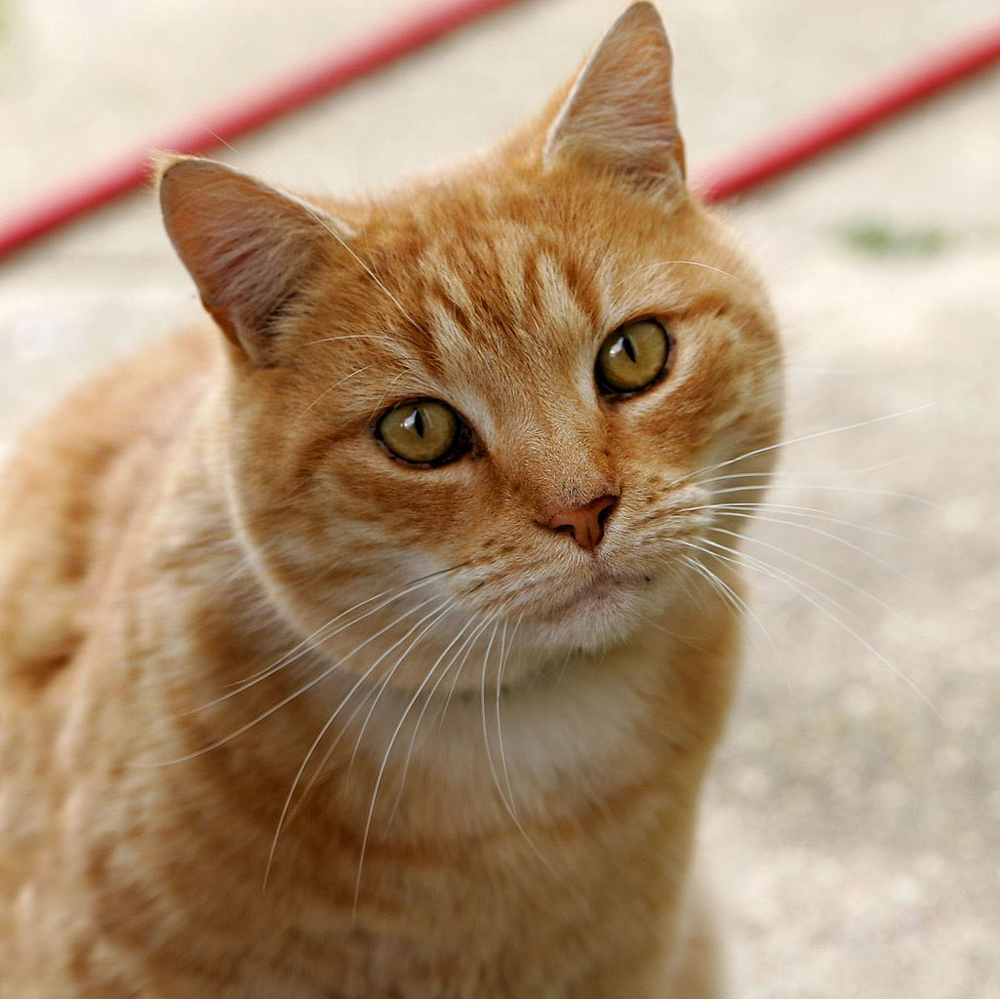

In [7]:
Image(filename='images\cat03.jpg') 

Flags

cv2.IMREAD_GRAYSCALE or 0: Loads image in grayscale mode.

cv2.IMREAD_COLOR or 1: Loads a color image. Any transparency of image will be neglected. It is the default flag.

cv2.IMREAD_UNCHANGED or -1: Loads image as such including alpha channel.
OpenCV Documentation

In [28]:
cat0 = cv2.imread('images\cat03.jpg', 0)
print(cat)
print(cat.shape)
print(cat.dtype)

type(cat)

[[207 206 206 ... 224 224 223]
 [207 206 206 ... 224 224 224]
 [207 206 205 ... 224 224 224]
 ...
 [157 158 160 ... 215 215 215]
 [156 157 159 ... 215 215 214]
 [155 156 158 ... 215 215 216]]
(1024, 1025)
uint8


numpy.ndarray

In [29]:
cat1 = cv2.imread('images\cat03.jpg', 1)
print(cat)
print(cat.shape)
type(cat)

[[207 206 206 ... 224 224 223]
 [207 206 206 ... 224 224 224]
 [207 206 205 ... 224 224 224]
 ...
 [157 158 160 ... 215 215 215]
 [156 157 159 ... 215 215 214]
 [155 156 158 ... 215 215 216]]
(1024, 1025)


numpy.ndarray

In [30]:
cat2 = cv2.imread('images\cat03.jpg', -1)
print(cat)
print(cat.shape)
type(cat)

[[207 206 206 ... 224 224 223]
 [207 206 206 ... 224 224 224]
 [207 206 205 ... 224 224 224]
 ...
 [157 158 160 ... 215 215 215]
 [156 157 159 ... 215 215 214]
 [155 156 158 ... 215 215 216]]
(1024, 1025)


numpy.ndarray

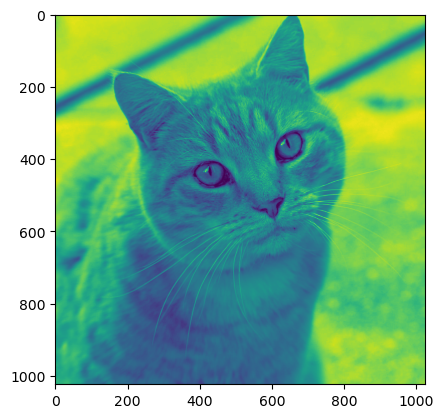

In [34]:
plt.imshow(cat0)

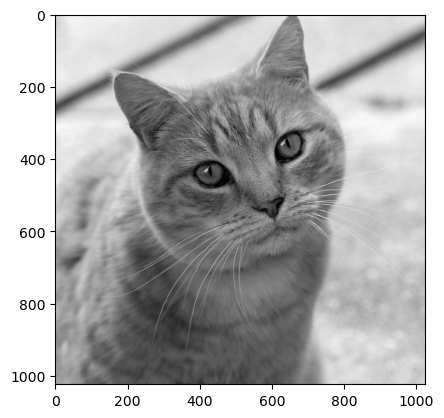

In [36]:
plt.imshow(cat0, cmap='gray')

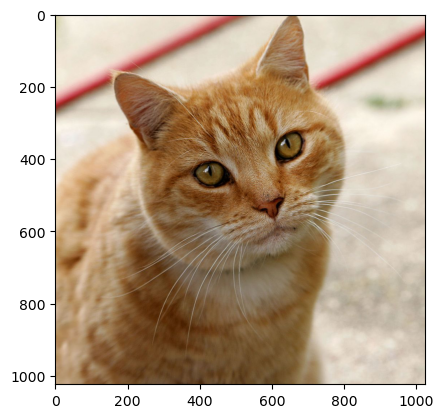

In [41]:
cat3 = cat1[:, :, ::-1]

plt.imshow(cat3, cmap='hsv')


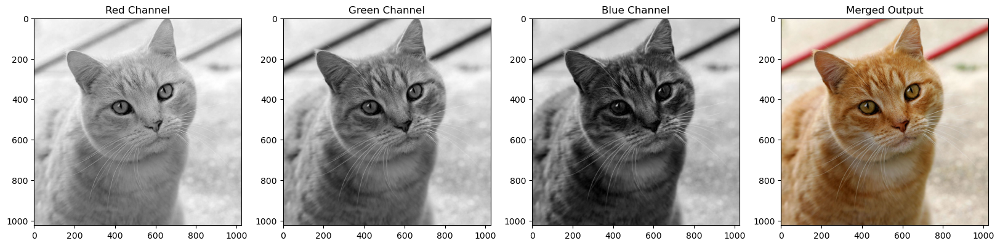

In [42]:
# Split the image into the B,G,R components
b,g,r = cv2.split(cat1)

# Show the channels
plt.figure(figsize=[20,5])
plt.subplot(141);plt.imshow(r,cmap='gray');plt.title("Red Channel");
plt.subplot(142);plt.imshow(g,cmap='gray');plt.title("Green Channel");
plt.subplot(143);plt.imshow(b,cmap='gray');plt.title("Blue Channel");

# Merge the individual channels into a BGR image
imgMerged = cv2.merge((b,g,r))
# Show the merged output
plt.subplot(144);plt.imshow(imgMerged[:,:,::-1]);plt.title("Merged Output");

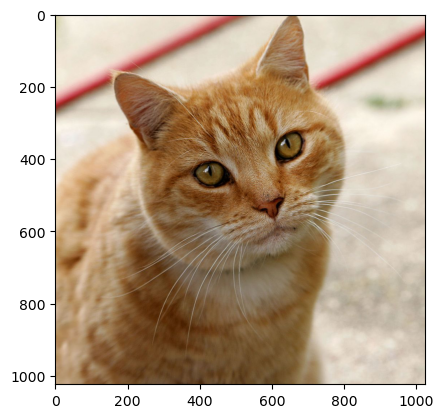

In [55]:
img_NZ_rgb = cv2.cvtColor(cat1, cv2.COLOR_BGR2RGB)
plt.imshow(img_NZ_rgb)

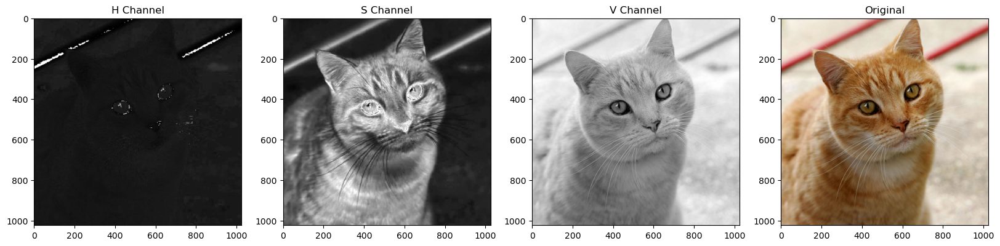

In [57]:
img_hsv = cv2.cvtColor(cat1, cv2.COLOR_BGR2HSV)
# Split the image into the B,G,R components
h,s,v = cv2.split(img_hsv)

# Show the channels
plt.figure(figsize=[20,5])
plt.subplot(141);plt.imshow(h,cmap='gray');plt.title("H Channel");
plt.subplot(142);plt.imshow(s,cmap='gray');plt.title("S Channel");
plt.subplot(143);plt.imshow(v,cmap='gray');plt.title("V Channel");
plt.subplot(144);plt.imshow(img_NZ_rgb);plt.title("Original");


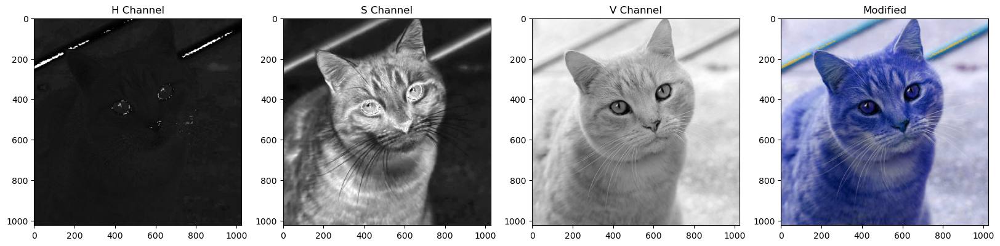

In [58]:

h_new = h+100
img_NZ_merged = cv2.merge((h_new,s,v))
img_NZ_rgb = cv2.cvtColor(img_NZ_merged, cv2.COLOR_HSV2RGB)

# Show the channels
plt.figure(figsize=[20,5])
plt.subplot(141);plt.imshow(h,cmap='gray');plt.title("H Channel");
plt.subplot(142);plt.imshow(s,cmap='gray');plt.title("S Channel");
plt.subplot(143);plt.imshow(v,cmap='gray');plt.title("V Channel");
plt.subplot(144);plt.imshow(img_NZ_rgb);plt.title("Modified");

In [59]:
cv2.imwrite("catcot.png", img_NZ_merged)


True

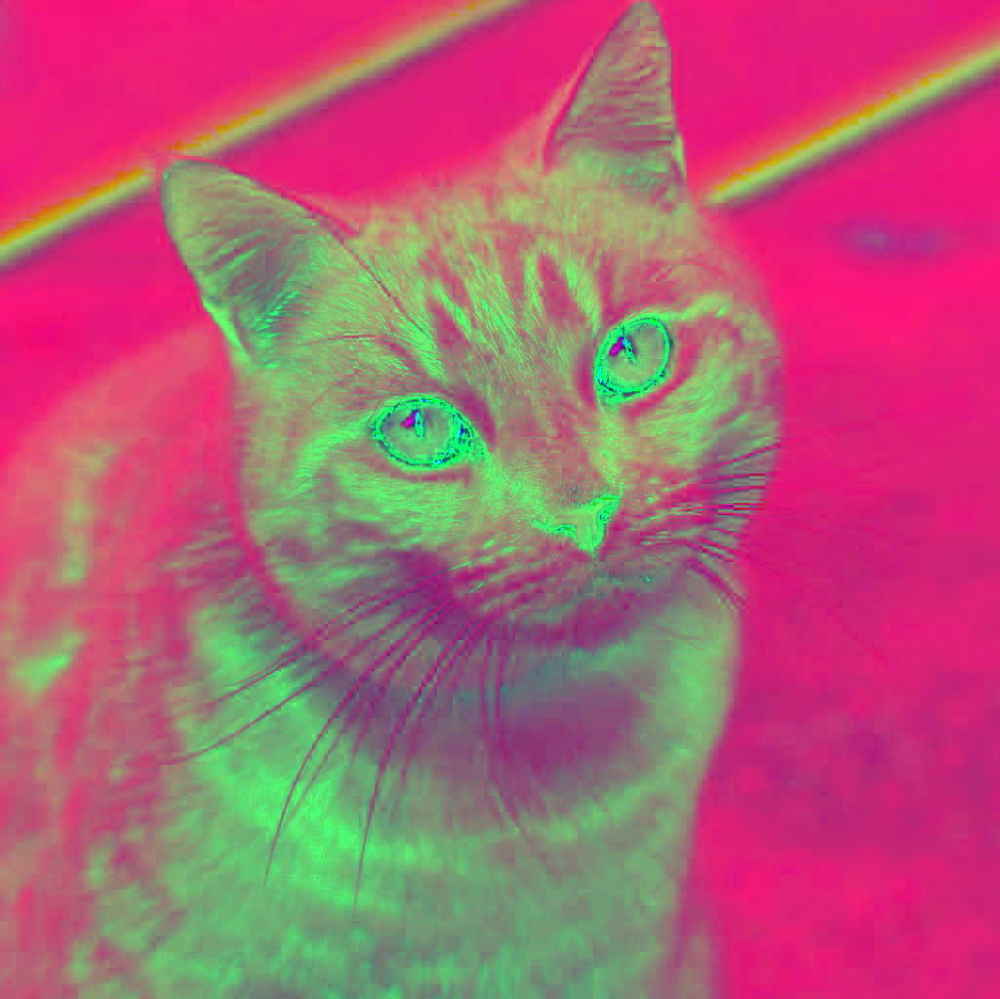

In [60]:
Image(filename='catcot.png') 

In [61]:
cv2.imwrite("images\catcot.jpg", img_NZ_merged)


True

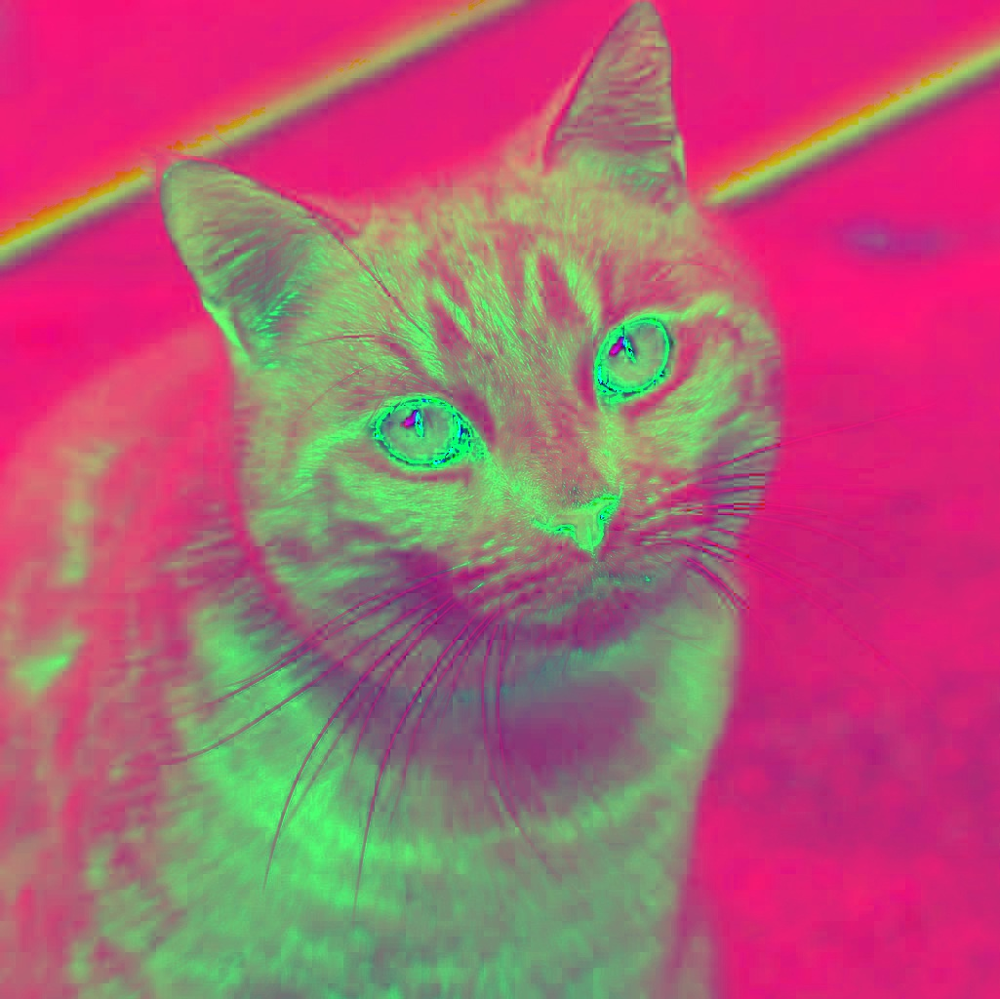

In [63]:
Image(filename='images\catcot.jpg') 

In [64]:
from PIL import Image 


[[207 206 206 ... 224 224 223]
 [207 206 206 ... 224 224 224]
 [207 206 205 ... 224 224 224]
 ...
 [157 158 160 ... 215 215 215]
 [156 157 159 ... 215 215 214]
 [155 156 158 ... 215 215 216]]


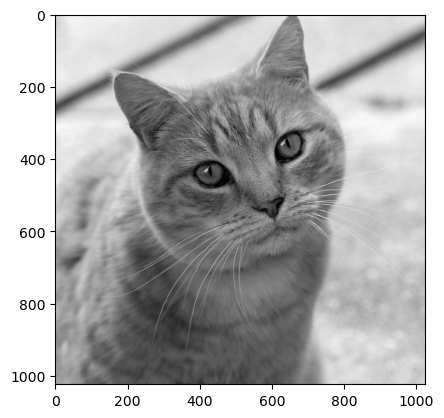

In [66]:

plt.imshow(cat0, cmap='gray')
print(cat0)

In [67]:
print(cat0[0,0])

207


[[207 206 206 ... 224 224 223]
 [207 206 206 ... 224 224 224]
 [207 206 255 ... 224 224 224]
 ...
 [157 158 160 ... 215 215 215]
 [156 157 159 ... 215 215 214]
 [155 156 158 ... 215 215 216]]


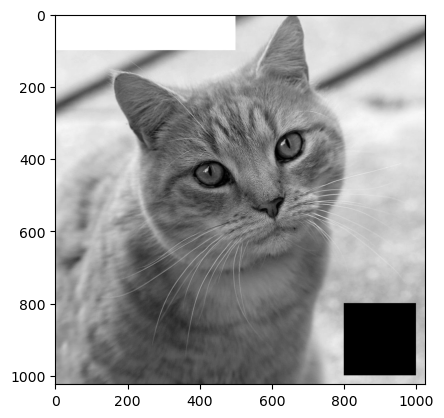

In [72]:
cb_img_copy = cat.copy()
cb_img_copy[2:100,2:500] = 255
cb_img_copy[2,3] = 200
cb_img_copy[3,2] = 200
cb_img_copy[800:1000,800:1000] = 0



plt.imshow(cb_img_copy, cmap='gray')
print(cb_img_copy)

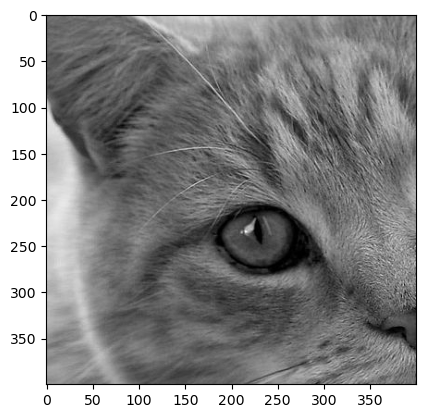

In [75]:
cropped_region = cat0[200:600, 200:600]
plt.imshow(cropped_region, cmap='gray')

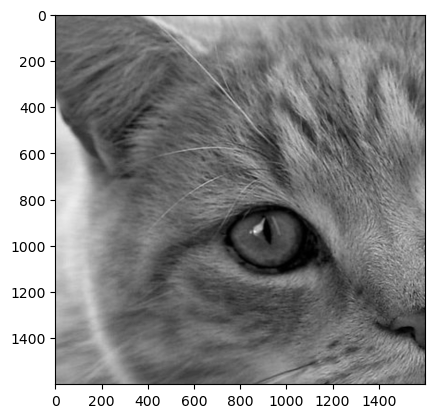

In [78]:
resized_cropped_region_2x = cv2.resize(cropped_region,None,fx=4, fy=4)
plt.imshow(resized_cropped_region_2x, cmap='gray')

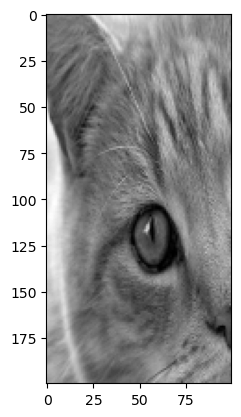

In [81]:
desired_width = 100
desired_height = 200
dim = (desired_width, desired_height)

# Resize background image to sae size as logo image
resized_cropped_region = cv2.resize(cropped_region, dsize=dim, interpolation=cv2.INTER_AREA)
plt.imshow(resized_cropped_region, cmap='gray')

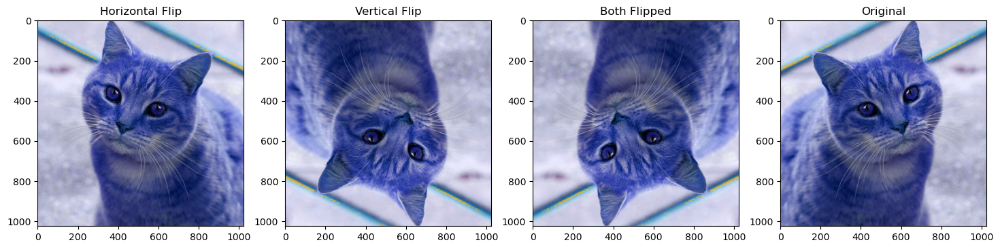

In [82]:
img_NZ_rgb_flipped_horz = cv2.flip(img_NZ_rgb, 1)
img_NZ_rgb_flipped_vert = cv2.flip(img_NZ_rgb, 0)
img_NZ_rgb_flipped_both = cv2.flip(img_NZ_rgb, -1)

# Show the images
plt.figure(figsize=[18,5])
plt.subplot(141);plt.imshow(img_NZ_rgb_flipped_horz);plt.title("Horizontal Flip");
plt.subplot(142);plt.imshow(img_NZ_rgb_flipped_vert);plt.title("Vertical Flip");
plt.subplot(143);plt.imshow(img_NZ_rgb_flipped_both);plt.title("Both Flipped");
plt.subplot(144);plt.imshow(img_NZ_rgb);plt.title("Original");


In [83]:
import matplotlib
matplotlib.rcParams['figure.figsize'] = (9.0, 9.0)

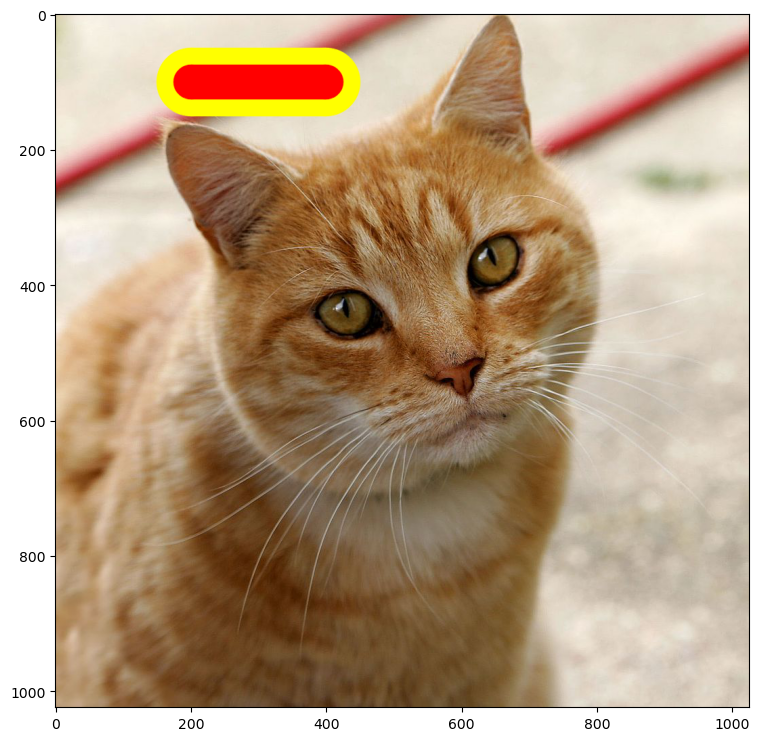

In [88]:
imageLine = cat1.copy()

# The line starts from (200,100) and ends at (400,100)
# The color of the line is YELLOW (Recall that OpenCV uses BGR format)
# Thickness of line is 5px
# Linetype is cv2.LINE_AA

cv2.line(imageLine, (200, 100), (400, 100), (0, 255, 255), thickness=100, lineType=cv2.LINE_AA);
cv2.line(imageLine, (200, 100), (400, 100), (0, 0, 255), thickness=50, lineType=cv2.LINE_AA);

# Display the image
plt.imshow(imageLine[:,:,::-1]);

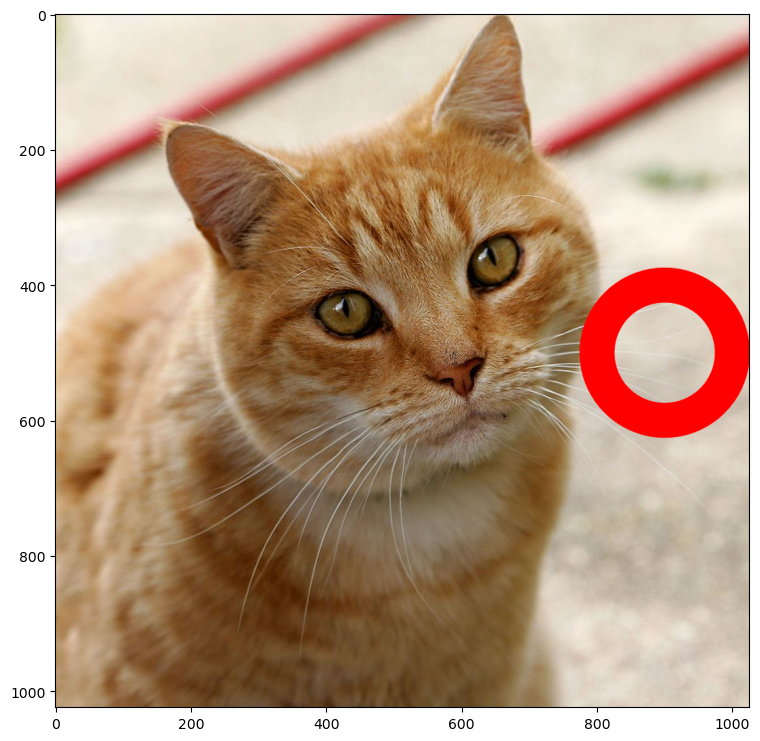

In [91]:
image = cat1
imageCircle = image.copy()

cv2.circle(imageCircle, (900,500), 100, (0, 0, 255), thickness=50, lineType=cv2.LINE_AA);
plt.imshow(imageCircle[:,:,::-1]);

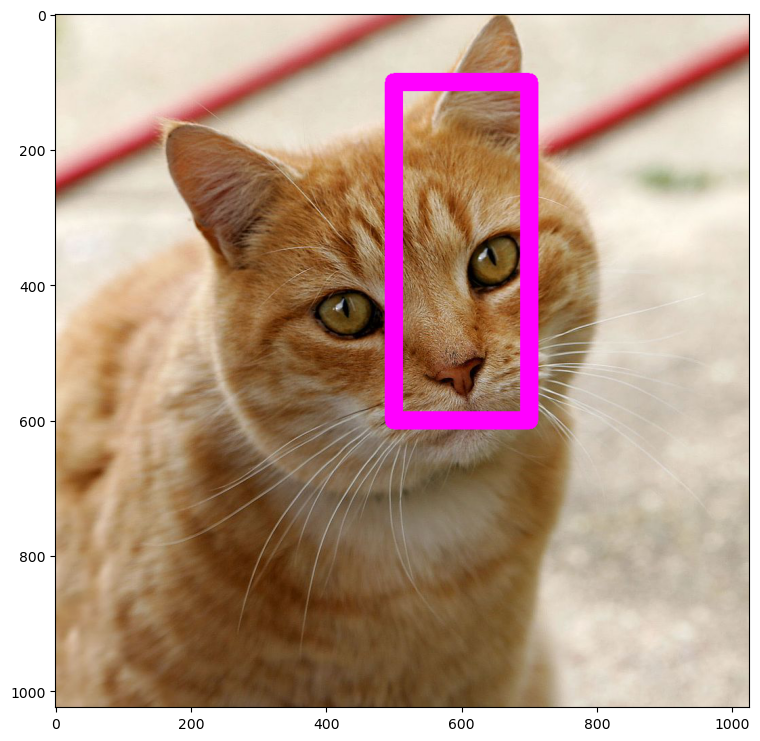

In [92]:
imageRectangle = image.copy()

cv2.rectangle(imageRectangle, (500, 100), (700,600), (255, 0, 255), thickness=25, lineType=cv2.LINE_8);

# Display the image
plt.imshow(imageRectangle[:,:,::-1])

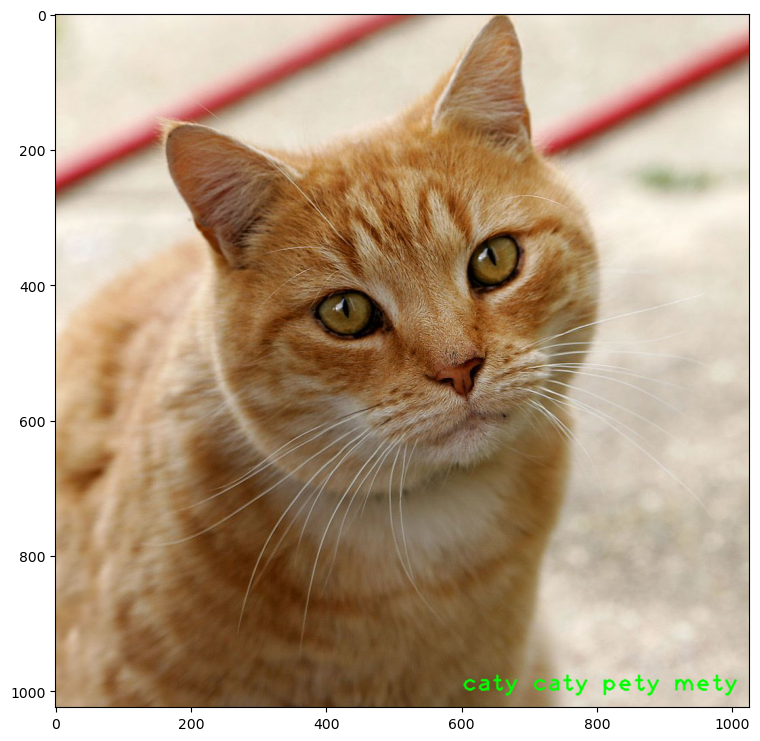

In [94]:
imageText = image.copy()
text = "caty caty pety mety"
fontScale = 2.3
fontFace = cv2.FONT_HERSHEY_PLAIN
fontColor = (0, 255, 0)
fontThickness = 2

cv2.putText(imageText, text, (600, 1000), fontFace, fontScale, fontColor, fontThickness, cv2.LINE_AA);

# Display the image
plt.imshow(imageText[:,:,::-1])

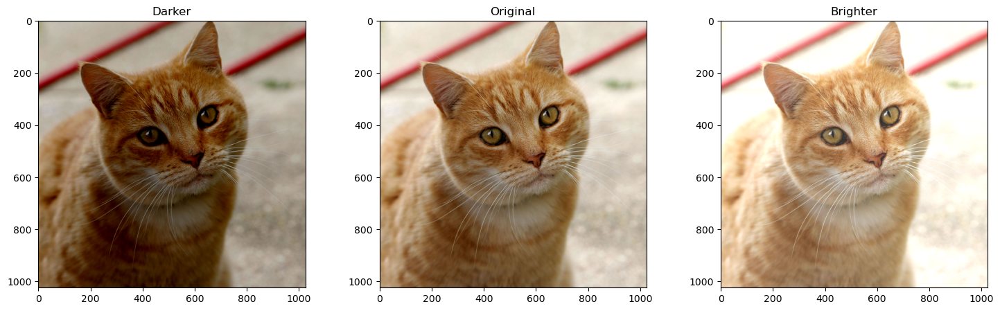

In [102]:
img_NZ_rgb = cv2.cvtColor(cat1, cv2.COLOR_BGR2RGB)

img_rgb = img_NZ_rgb
matrix = np.ones(img_rgb.shape, dtype = "uint8") * 50

img_rgb_brighter = cv2.add(img_rgb, matrix)
img_rgb_darker   = cv2.subtract(img_rgb, matrix)

# Show the images
plt.figure(figsize=[18,5])
plt.subplot(131); plt.imshow(img_rgb_darker);  plt.title("Darker");
plt.subplot(132); plt.imshow(img_rgb);         plt.title("Original");
plt.subplot(133); plt.imshow(img_rgb_brighter);plt.title("Brighter");

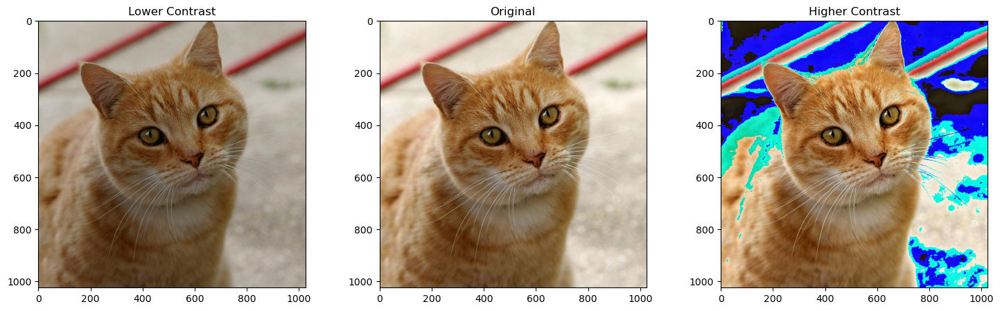

In [103]:
matrix1 = np.ones(img_rgb.shape) * .8
matrix2 = np.ones(img_rgb.shape) * 1.2

img_rgb_darker   = np.uint8(cv2.multiply(np.float64(img_rgb), matrix1))
img_rgb_brighter = np.uint8(cv2.multiply(np.float64(img_rgb), matrix2))

# Show the images
plt.figure(figsize=[18,5])
plt.subplot(131); plt.imshow(img_rgb_darker);  plt.title("Lower Contrast");
plt.subplot(132); plt.imshow(img_rgb);         plt.title("Original");
plt.subplot(133); plt.imshow(img_rgb_brighter);plt.title("Higher Contrast");

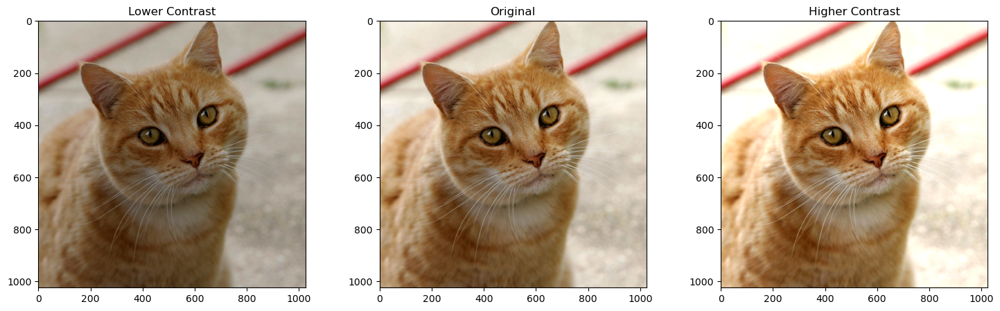

In [104]:
 matrix1 = np.ones(img_rgb.shape) * .8
matrix2 = np.ones(img_rgb.shape) * 1.2

img_rgb_lower   = np.uint8(cv2.multiply(np.float64(img_rgb), matrix1))
img_rgb_higher  = np.uint8(np.clip(cv2.multiply(np.float64(img_rgb), matrix2),0,255))

# Show the images
plt.figure(figsize=[18,5])
plt.subplot(131); plt.imshow(img_rgb_lower);  plt.title("Lower Contrast");
plt.subplot(132); plt.imshow(img_rgb);         plt.title("Original");
plt.subplot(133); plt.imshow(img_rgb_higher);plt.title("Higher Contrast");

(1024, 1025)


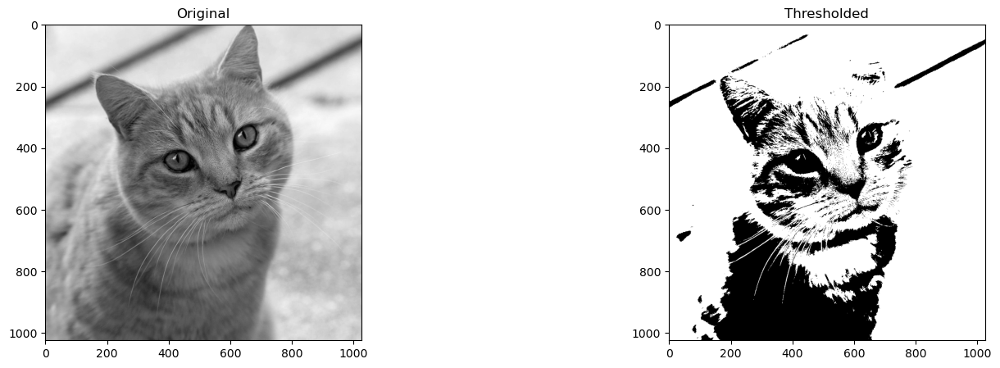

In [108]:
retval, img_thresh = cv2.threshold(cat0, 100, 255, cv2.THRESH_BINARY)

# Show the images
plt.figure(figsize=[18,5])
plt.subplot(121); plt.imshow(cat0, cmap="gray");         plt.title("Original");
plt.subplot(122); plt.imshow(img_thresh, cmap="gray");       plt.title("Thresholded");

print(img_thresh.shape)

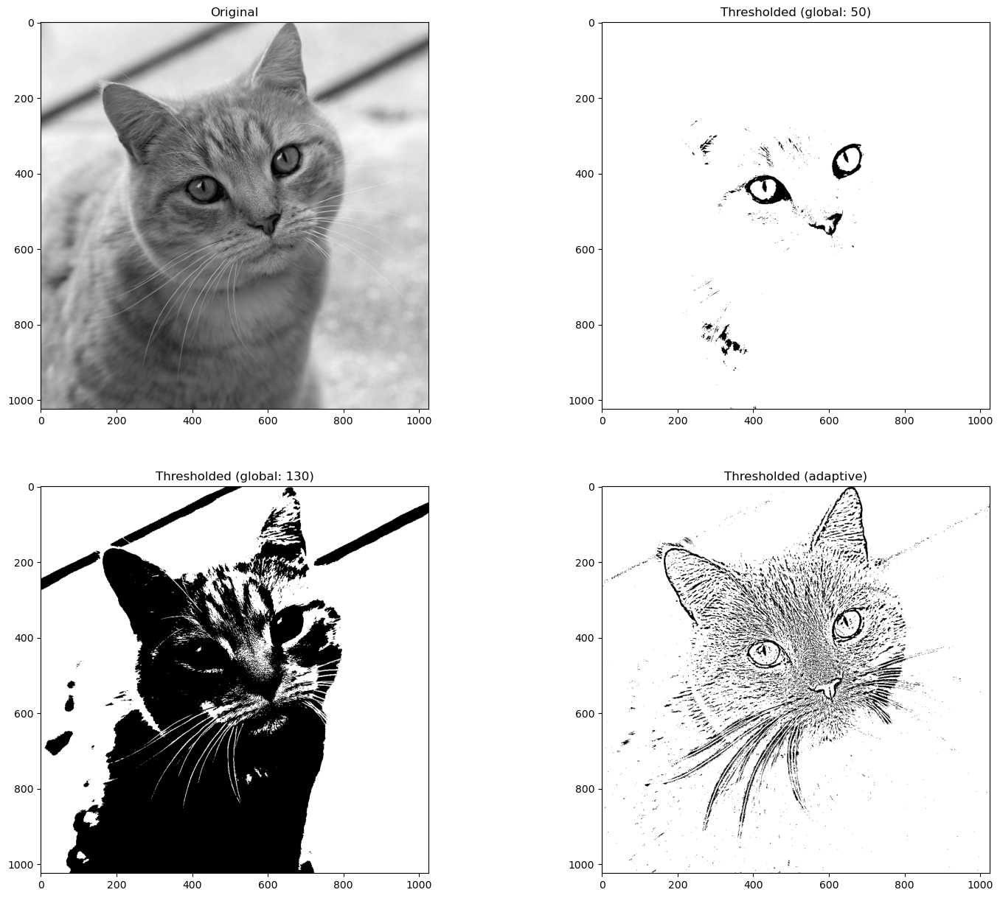

In [113]:

retval, img_thresh_gbl_1 = cv2.threshold(cat0,50, 255, cv2.THRESH_BINARY)

# Perform global thresholding
retval, img_thresh_gbl_2 = cv2.threshold(cat0,130, 255, cv2.THRESH_BINARY)

# Perform adaptive thresholding
img_thresh_adp = cv2.adaptiveThreshold(cat0, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 7)

# Show the images
plt.figure(figsize=[18,15])
plt.subplot(221); plt.imshow(cat0,        cmap="gray");  plt.title("Original");
plt.subplot(222); plt.imshow(img_thresh_gbl_1,cmap="gray");  plt.title("Thresholded (global: 50)");
plt.subplot(223); plt.imshow(img_thresh_gbl_2,cmap="gray");  plt.title("Thresholded (global: 130)");
plt.subplot(224); plt.imshow(img_thresh_adp,  cmap="gray");  plt.title("Thresholded (adaptive)");

In [145]:
img_rec = cat0

img_cir = cv2.imread("images\cadre.jpg", cv2.IMREAD_GRAYSCALE)


desired_width, desired_height = img_rec.shape
dim = (desired_height ,desired_width)

# Resize background image to sae size as logo image
img_cir = cv2.resize(img_cir, dsize=dim, interpolation=cv2.INTER_AREA)

(1024, 1025)
(1024, 1025)


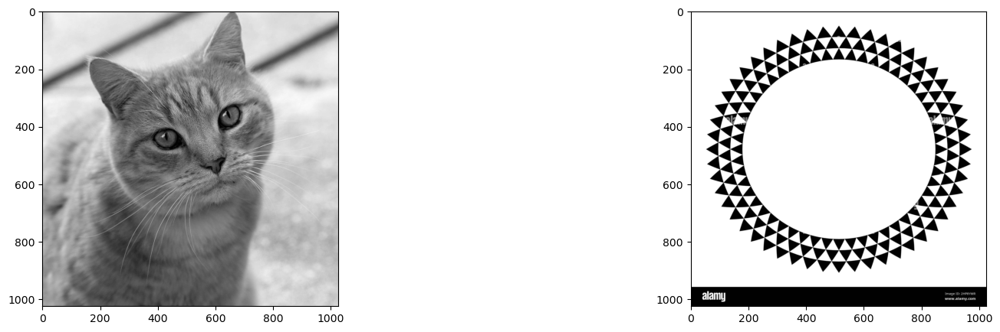

In [146]:

plt.figure(figsize=[20,5])
plt.subplot(121);plt.imshow(img_rec,cmap='gray')
plt.subplot(122);plt.imshow(img_cir,cmap='gray')
print(img_rec.shape)
print(img_cir.shape)

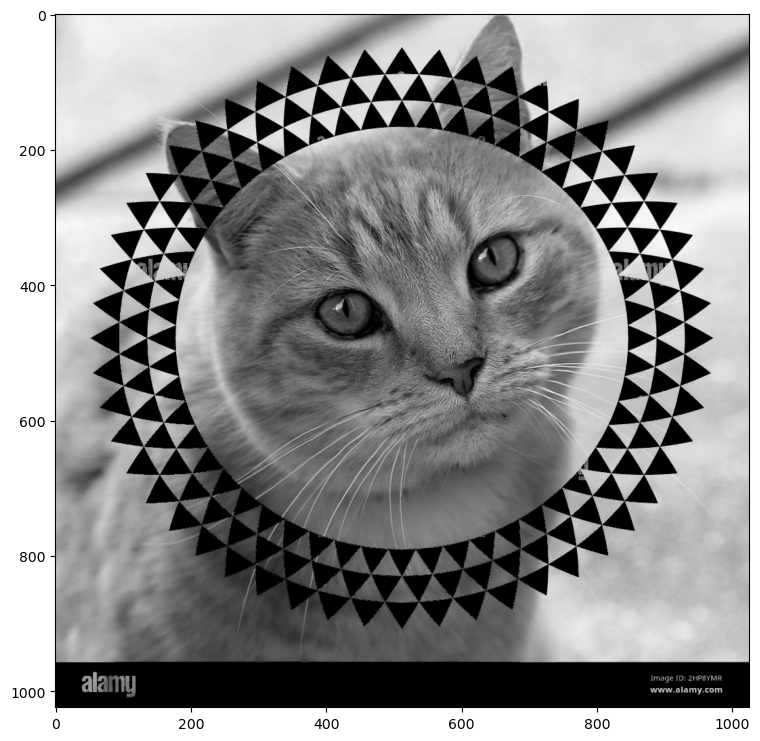

In [147]:
result = cv2.bitwise_and(img_rec, img_cir, mask = None)
plt.imshow(result,cmap='gray')

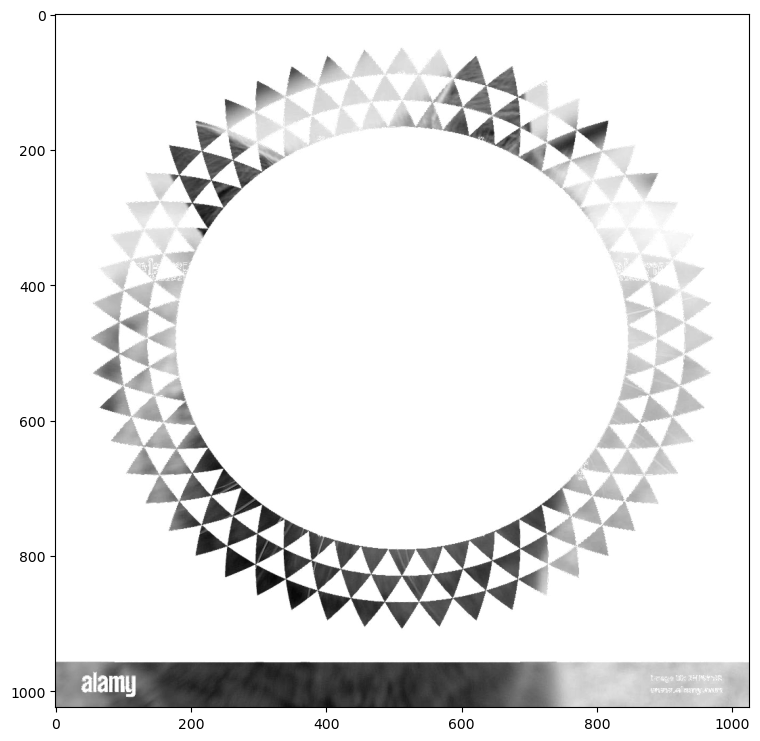

In [148]:
result = cv2.bitwise_or(img_rec, img_cir, mask = None)
plt.imshow(result,cmap='gray')

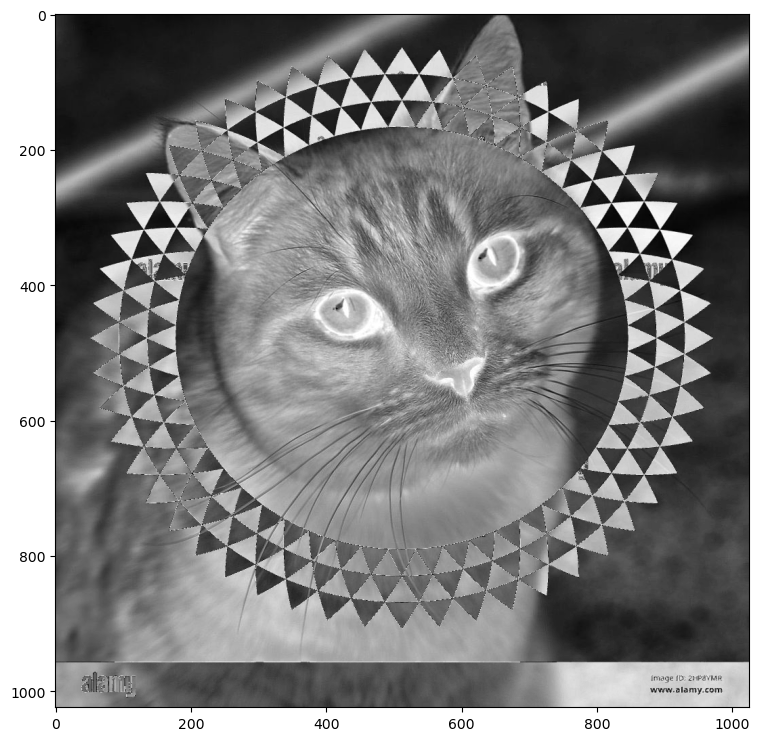

In [149]:
result = cv2.bitwise_xor(img_rec, img_cir, mask = None)
plt.imshow(result,cmap='gray')

(1024, 1025)


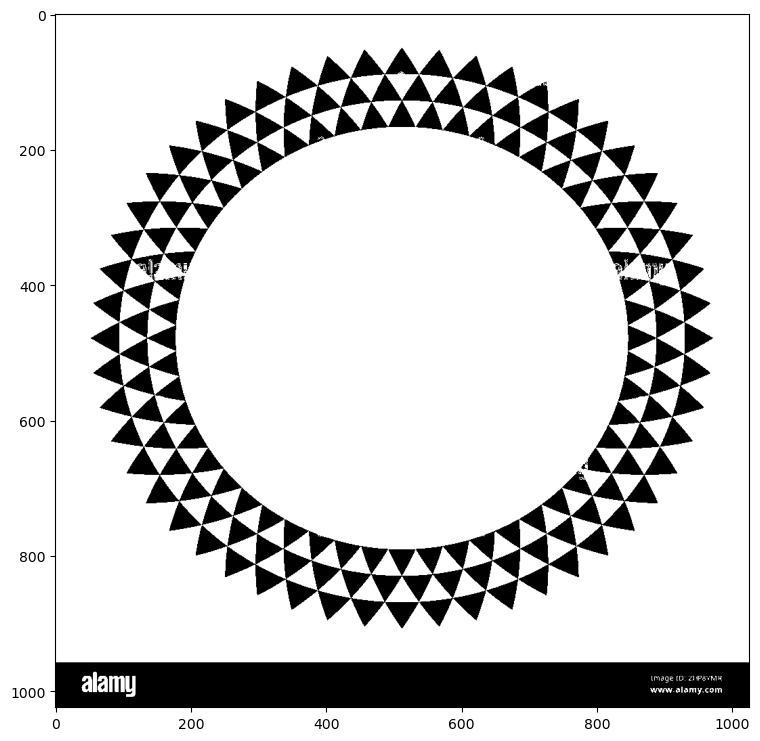

In [151]:

retval, img_mask = cv2.threshold(img_cir,127,255,cv2.THRESH_BINARY)

plt.imshow(img_mask,cmap="gray")
print(img_mask.shape)

In [152]:
import sys


In [153]:
s = 0
if len(sys.argv) > 1:
    s = sys.argv[1]

source = cv2.VideoCapture(s)

win_name = 'Camera Preview'
cv2.namedWindow(win_name, cv2.WINDOW_NORMAL)

while cv2.waitKey(1) != 27: # Escape
    has_frame, frame = source.read()
    if not has_frame:
        break
    cv2.imshow(win_name, frame)

source.release()
cv2.destroyWindow(win_name)

In [160]:
%%time
source = 'images/t.mp4'  # source = 0 for webcam

cap = cv2.VideoCapture(source)

CPU times: total: 31.2 ms
Wall time: 64.5 ms


In [161]:
if (cap.isOpened()== False): 
  print("Error opening video stream or file")

In [162]:
ret, frame = cap.read()

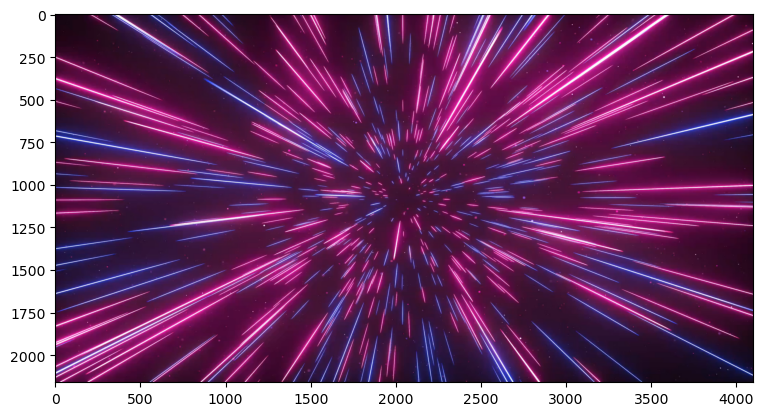

In [163]:
plt.imshow(frame[...,::-1])

In [169]:
from IPython.display import HTML
HTML("""
<video width=1024 controls>
  <source src="cap" type="video/mp4">
</video>
""")

In [170]:
import cv2
import sys
import numpy

PREVIEW  = 0   # Preview Mode
BLUR     = 1   # Blurring Filter
FEATURES = 2   # Corner Feature Detector
CANNY    = 3   # Canny Edge Detector

feature_params = dict( maxCorners = 500,
                       qualityLevel = 0.2,
                       minDistance = 15,
                       blockSize = 9)
s = 0
if len(sys.argv) > 1:
    s = sys.argv[1]

image_filter = PREVIEW
alive = True

win_name = 'Camera Filters'
cv2.namedWindow(win_name, cv2.WINDOW_NORMAL)
result = None

source = cv2.VideoCapture(s)

while alive:
    has_frame, frame = source.read()
    if not has_frame:
        break

    frame = cv2.flip(frame,1)

    if image_filter == PREVIEW:
        result = frame
    elif image_filter == CANNY:
        result = cv2.Canny(frame, 80, 150)
    elif image_filter == BLUR:
        result = cv2.blur(frame, (13,13))
    elif image_filter == FEATURES:
         result = frame
         frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
         corners = cv2.goodFeaturesToTrack(frame_gray, **feature_params)
         if corners is not None:
             for x, y in numpy.float32(corners).reshape(-1, 2):
                 cv2.circle(result, (x,y), 10, (0, 255 , 0), 1)

    cv2.imshow(win_name, result)

    key = cv2.waitKey(1)
    if key == ord('Q') or key == ord('q') or key == 27:
        alive = False
    elif key == ord('C') or key == ord('c'):
        image_filter = CANNY
    elif key == ord('B') or key == ord('b'):
        image_filter = BLUR
    elif key == ord('F') or key == ord('f'):
        image_filter = FEATURES
    elif key == ord('P') or key == ord('p'):
        image_filter = PREVIEW

source.release()
cv2.destroyWindow(win_name)


In [184]:
refFilename = "images\c.jpg"
print("Reading reference image : ", refFilename)
im1 = cv2.imread(refFilename, cv2.IMREAD_COLOR)
im1 = cv2.cvtColor(im1, cv2.COLOR_BGR2RGB)

# Read image to be aligned
imFilename = "images\d1.jpg"
print("Reading image to align : ", imFilename)
im2 = cv2.imread(imFilename, cv2.IMREAD_COLOR)
im2 = cv2.cvtColor(im2, cv2.COLOR_BGR2RGB)

Reading reference image :  images\c.jpg
Reading image to align :  images\d1.jpg


Text(0.5, 1.0, 'Scanned Form')

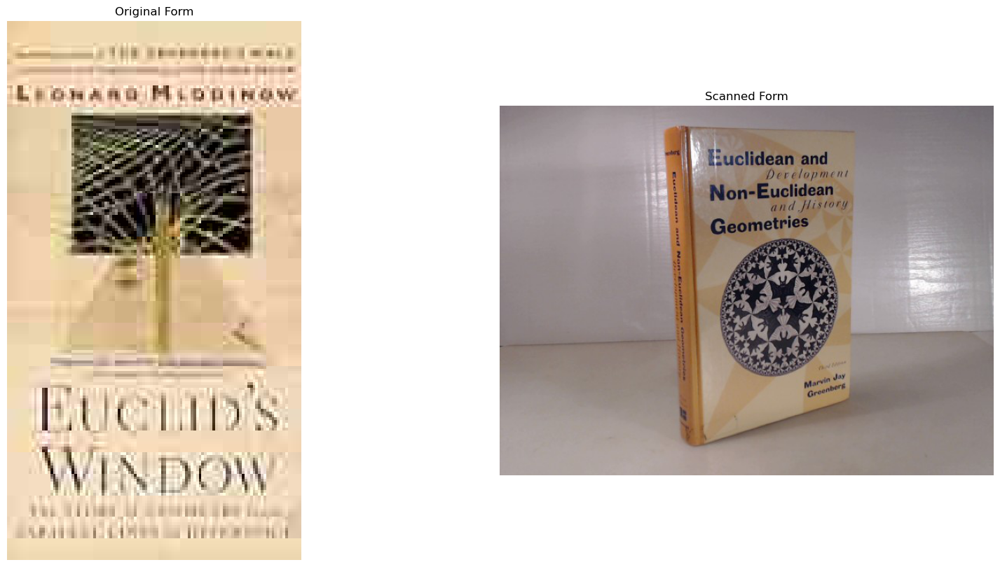

In [185]:
plt.figure(figsize=[20,10]); 
plt.subplot(121); plt.axis('off'); plt.imshow(im1); plt.title("Original Form")
plt.subplot(122); plt.axis('off'); plt.imshow(im2); plt.title("Scanned Form")

In [186]:
# Convert images to grayscale
im1_gray = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY)
im2_gray = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY)
  

# Detect ORB features and compute descriptors.
MAX_NUM_FEATURES = 500
orb = cv2.ORB_create(MAX_NUM_FEATURES)
keypoints1, descriptors1 = orb.detectAndCompute(im1_gray, None)
keypoints2, descriptors2 = orb.detectAndCompute(im2_gray, None)

# Display 
im1_display = cv2.drawKeypoints(im1, keypoints1, outImage=np.array([]), color=(255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
im2_display = cv2.drawKeypoints(im2, keypoints2, outImage=np.array([]), color=(255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)


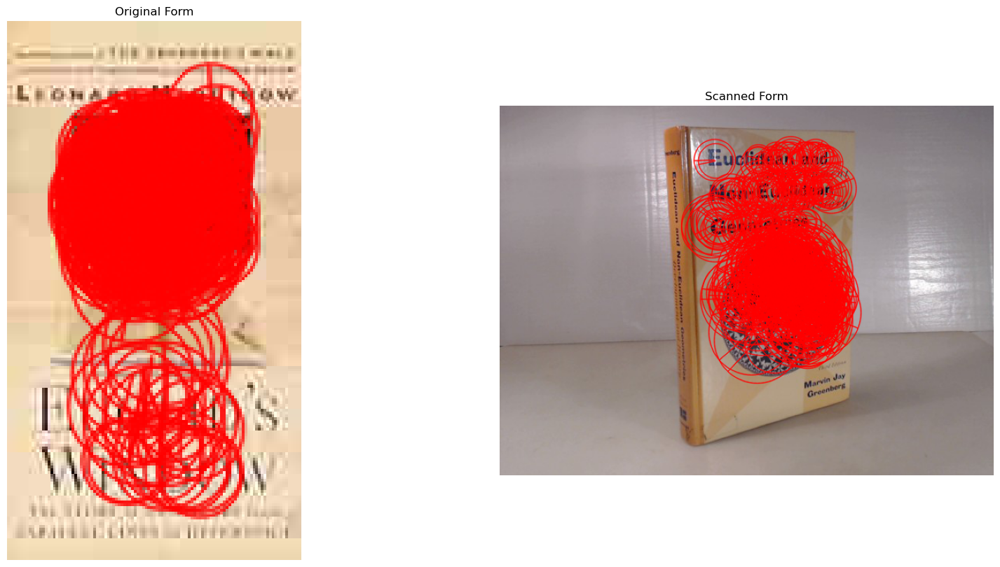

In [187]:
plt.figure(figsize=[20,10])
plt.subplot(121); plt.axis('off'); plt.imshow(im1_display); plt.title("Original Form");
plt.subplot(122); plt.axis('off'); plt.imshow(im2_display); plt.title("Scanned Form");